In [3]:
# Traffic & Air Quality Analysis Using datascience + GeoPandas + DBSCAN + Geohashing

# STEP 1: Import libraries
# ----------------------------------------
# Import all necessary libraries for data handling, spatial analysis, plotting, and clustering
from datascience import Table
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.plugins import HeatMap
from branca.colormap import LinearColormap
from matplotlib import cm, colors
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from geopy.distance import great_circle
from sklearn.metrics import silhouette_score
import geohash2
import glob
%matplotlib inline

In [4]:
# STEP 2: Load and combine AIR QUALITY data from multiple CSVs
# ----------------------------------------
# Combine all air quality data parts into one DataFrame
files = sorted(glob.glob("chicago_eclipse_data_part_*.csv"))
aq_df = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)
print(aq_df.columns)
aq_df

Index(['City', 'DeviceId', 'LocationName', 'Latitude', 'Longitude',
       'ReadingDateTimeUTC', 'PM25', 'CalibratedPM25', 'CalibratedO3',
       'CalibratedNO2', 'CO', 'Temperature', 'Humidity', 'BatteryLevel',
       'PercentBattery', 'CellSignal'],
      dtype='object')


,City,DeviceId,LocationName,Latitude,Longitude,ReadingDateTimeUTC,PM25,CalibratedPM25,CalibratedO3,CalibratedNO2,CO,Temperature,Humidity,BatteryLevel,PercentBattery,CellSignal
0,Chicago,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:03:00,5.561094,NaN,NaN,NaN,0.123580,27.383499,55.128479,4.237187,93.964844,-76.0
1,Chicago,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:08:10,6.633914,NaN,NaN,NaN,0.132103,27.079086,55.059814,4.236094,93.964844,-81.0
2,Chicago,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:13:20,4.068707,NaN,NaN,NaN,0.131126,27.079086,55.035400,4.236406,93.964844,-80.0
3,Chicago,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:18:30,6.351702,NaN,NaN,NaN,0.138784,26.945572,54.632568,4.236094,93.863281,-82.0
4,Chicago,2002,State & Garfield (SB),41.794921,-87.625857,2021-06-20 00:23:40,9.574065,NaN,NaN,NaN,0.413070,26.828079,53.907776,4.235938,93.863281,-81.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461084,Chicago,2113,Division & Larrabee (EB),41.903627,-87.643443,2021-08-20 11:55:10,17.235613,15.85,22.52,13.78,0.407807,24.849396,82.350159,4.184531,89.472656,-85.0
2461085,Chicago,2113,Division & Larrabee (EB),41.903627,-87.643443,2021-08-20 12:00:20,11.742577,14.20,20.00,12.48,0.382384,25.111084,82.296753,4.184531,89.578125,-86.0
2461086,Chicago,2113,Division & Larrabee (EB),41.903627,-87.643443,2021-08-20 12:05:30,13.482563,14.78,21.90,13.01,0.385963,25.236588,82.284546,4.185000,89.578125,-86.0
2461087,Chicago,2113,Division & Larrabee (EB),41.903627,-87.643443,2021-08-20 12:10:39,10.450826,15.47,19.72,13.55,0.438555,25.362091,82.218933,4.184219,89.578125,-89.0


In [5]:
# STEP 3: Load TAXI data
# ----------------------------------------
# Load taxi trip data from a single file
taxi_df = pd.read_csv("taxi_data.csv")
print(taxi_df.columns)
taxi_df

Index(['Taxi ID', 'Trip Start Timestamp', 'Trip End Timestamp', 'Trip Seconds',
       'Trip Miles', 'Company', 'Pickup Centroid Latitude',
       'Pickup Centroid Longitude', 'Pickup Centroid Location',
       'Dropoff Centroid Latitude', 'Dropoff Centroid Longitude',
       'Dropoff Centroid  Location', 'Trip ID'],
      dtype='object')


,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,Trip ID
0,cf39200ae52386dfa52be5a8e1da54653690fac9fba627...,10/03/2021 08:30:00 PM,10/03/2021 09:00:00 PM,1584.0,18.07,Flash Cab,41.877406,-87.621972,POINT (-87.6219716519 41.8774061234),41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),ce57f9a1c27516221d55f38406606017a319357f
1,d86670e36b21209fc6a376b3767b88caa2219ffceec14c...,10/03/2021 08:30:00 PM,10/03/2021 09:00:00 PM,1606.0,16.60,Chicago Independents,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),41.885300,-87.642808,POINT (-87.6428084655 41.8853000224),ce7ee452dcf80e2549a51c30404b368fce218179
2,7ff3ea8c15d902e432f0f3ca3aab1d5f20bff4c4fedfb5...,10/03/2021 08:30:00 PM,10/03/2021 08:45:00 PM,660.0,1.40,Taxi Affiliation Services,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),c9d7445854e46a5c7725407517980b08b3c559b1
3,a39edfa6e2ec6209ece046221d25bdb4c4fee327de239a...,10/03/2021 08:30:00 PM,10/03/2021 08:30:00 PM,498.0,3.45,Sun Taxi,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),NaN,NaN,NaN,cc1f9219075111ff8a7a027e6ed6a31182bc3dad
4,49d226e40bf779a8ba34d280971ff8396b1afab2cdbb92...,10/03/2021 08:30:00 PM,10/03/2021 08:45:00 PM,618.0,0.00,Flash Cab,41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),41.850266,-87.667569,POINT (-87.667569312 41.8502663663),d239771039a83a8aebd9046291ee86b5ca11ec38
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2618446,d94ecbd1167693d3854fac6b4d884eae97f0ba5f43e5a6...,01/01/2021 08:45:00 PM,01/01/2021 09:15:00 PM,1500.0,11.90,Taxi Affiliation Services,41.707311,-87.534903,POINT (-87.5349029012 41.707311449),41.673820,-87.635740,POINT (-87.6357397768 41.6738199043),cea8966ca4a6753e838c3c744bdce4a672cf1433
2618447,2ea4ad2950f3bbdfdcfa7adb48e0dcee49d8a714b70243...,01/01/2021 08:45:00 PM,01/01/2021 09:00:00 PM,807.0,4.21,Flash Cab,41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),d7a483431c88d462f9b425bcc918fdb57aad3fa6
2618448,6eb285e549ebd23a688f5fe2145d88dba65e200024e421...,01/01/2021 08:45:00 PM,01/01/2021 09:00:00 PM,1260.0,0.00,Taxi Affiliation Services,41.792592,-87.769615,POINT (-87.7696154528 41.7925923603),41.874005,-87.663518,POINT (-87.6635175498 41.874005383),c777c96c9c866ad27d6b44683d914fd4ef367d1a
2618449,1aa27355c709dc0cba3790a2549861c6b7864165ccf020...,01/01/2021 08:45:00 PM,01/01/2021 09:15:00 PM,1320.0,8.90,Taxi Affiliation Services,41.835118,-87.618678,POINT (-87.6186777673 41.8351179863),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),e244964949d7ef10be59712fac41c5df3228941a


In [6]:
# Drop all rows with any NaN values in air quality data
aq_df = aq_df.dropna()
# Drop all rows with any NaN values in taxi data
taxi_df = taxi_df.dropna()

In [7]:
print("🔍 Null values in Air Quality Data:")
print(aq_df.isnull().sum())

print("🔍 Null values in Taxi Data:")
print(taxi_df.isnull().sum())

def null_report(df, name):
    print(f"🧾 Missing values in {name}:")
    nulls = df.isnull().sum()
    percent = (nulls / len(df)) * 100
    report = pd.DataFrame({"Null Count": nulls, "Percent": percent.round(2)})
    print(report[report["Null Count"] > 0])  # Show only columns with nulls
    print()

null_report(aq_df, "Air Quality Data")
null_report(taxi_df, "Taxi Data")

🔍 Null values in Air Quality Data:
City                  0
DeviceId              0
LocationName          0
Latitude              0
Longitude             0
ReadingDateTimeUTC    0
PM25                  0
CalibratedPM25        0
CalibratedO3          0
CalibratedNO2         0
CO                    0
Temperature           0
Humidity              0
BatteryLevel          0
PercentBattery        0
CellSignal            0
dtype: int64
🔍 Null values in Taxi Data:
Taxi ID                       0
Trip Start Timestamp          0
Trip End Timestamp            0
Trip Seconds                  0
Trip Miles                    0
Company                       0
Pickup Centroid Latitude      0
Pickup Centroid Longitude     0
Pickup Centroid Location      0
Dropoff Centroid Latitude     0
Dropoff Centroid Longitude    0
Dropoff Centroid  Location    0
Trip ID                       0
dtype: int64
🧾 Missing values in Air Quality Data:
Empty DataFrame
Columns: [Null Count, Percent]
Index: []

🧾 Missing value

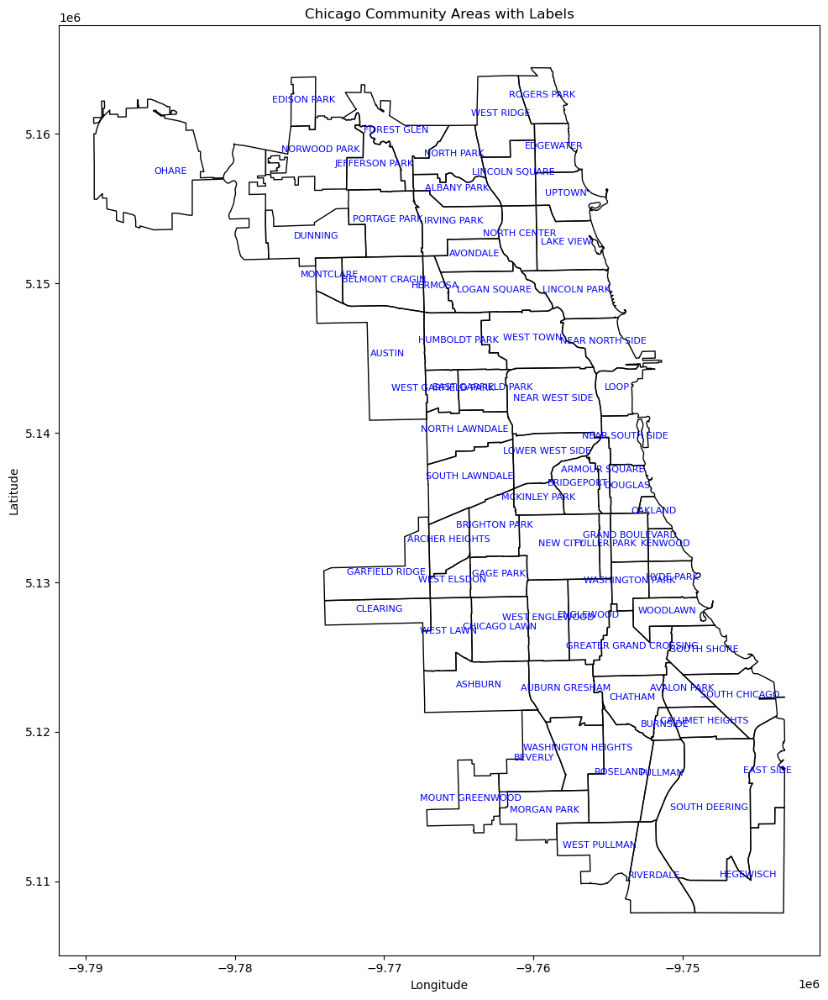

In [8]:
# Load shapefile
gdf = gpd.read_file("Chicago_Community_areas.shp")

# Create the plot
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(ax=ax, edgecolor='black', facecolor='none')

# Add labels using the 'community' column
for idx, row in gdf.iterrows():
    plt.text(row.geometry.centroid.x, row.geometry.centroid.y,
             s=row['community'], fontsize=8, ha='center', color='blue')

plt.title("Chicago Community Areas with Labels")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()

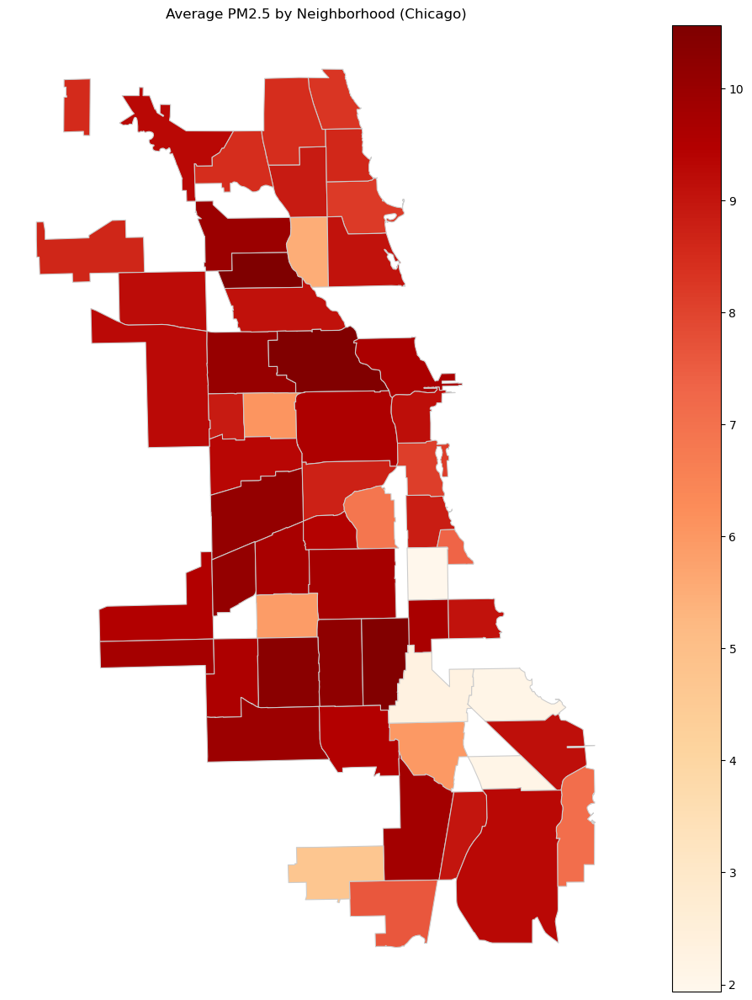

In [9]:
# STEP 4: Convert AIR QUALITY data to GeoDataFrame
# ----------------------------------------
# Create geometry points from Latitude and Longitude
aq_geometry = [Point(xy) for xy in zip(aq_df['Longitude'], aq_df['Latitude'])]
aq_gdf = gpd.GeoDataFrame(aq_df, geometry=aq_geometry, crs="EPSG:4326")

# STEP 5: Reproject shapefile to match air quality CRS (if needed)
# ----------------------------------------
if gdf.crs != "EPSG:4326":
    gdf = gdf.to_crs("EPSG:4326")

# STEP 6: Spatial JOIN — assign each air quality point to a neighborhood
# ----------------------------------------
joined_gdf = gpd.sjoin(aq_gdf, gdf, how="inner", predicate="within")

# STEP 7: Aggregate average PM2.5 by neighborhood
# ----------------------------------------
pm25_by_community = joined_gdf.groupby("community").agg({"PM25": "mean"}).reset_index()

# STEP 8: Merge with shapefile for plotting
# ----------------------------------------
gdf_with_pm25 = gdf.merge(pm25_by_community, on="community")

# STEP 9: Plot choropleth map of average PM2.5
# ----------------------------------------
fig, ax = plt.subplots(figsize=(12, 12))
gdf_with_pm25.plot(column="PM25", cmap="OrRd", linewidth=0.8, edgecolor="0.8", legend=True, ax=ax)

plt.title("Average PM2.5 by Neighborhood (Chicago)")
plt.axis("off")
plt.tight_layout()
plt.show()


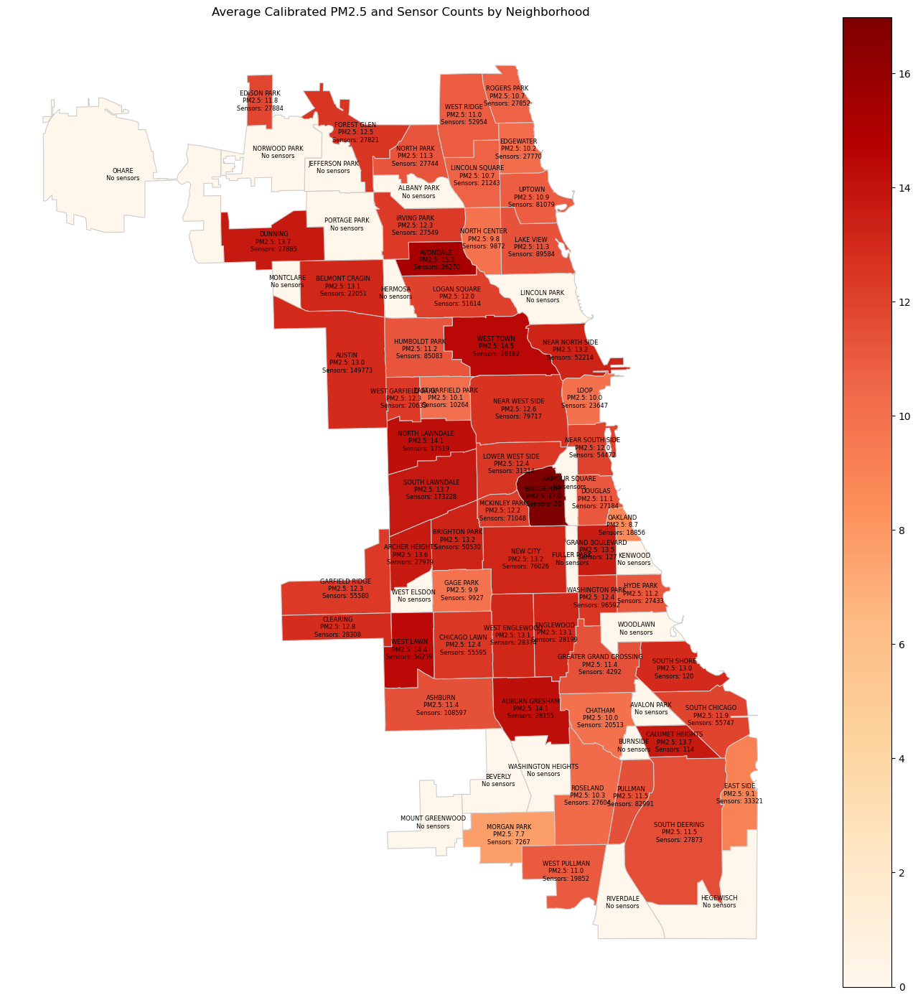

In [10]:
# STEP: Aggregate average CalibratedPM25 and sensor count
grouped = joined_gdf.groupby("community").agg({
    "CalibratedPM25": "mean",
    "geometry": "count"  # counts number of sensors per neighborhood
}).reset_index()

# Rename columns for clarity
grouped.rename(columns={
    "CalibratedPM25": "PM25",
    "geometry": "SensorCount"
}, inplace=True)

# STEP: Merge with all neighborhoods (so areas with no sensors are included too)
gdf_plot = gdf.merge(grouped, on="community", how="left")

# Replace NaNs with meaningful info
gdf_plot["PM25"] = gdf_plot["PM25"].fillna(0)
gdf_plot["SensorCount"] = gdf_plot["SensorCount"].fillna(0).astype(int)

# Create label column
gdf_plot["Label"] = gdf_plot.apply(
    lambda row: f"{row['community']}\nPM2.5: {row['PM25']:.1f}\nSensors: {row['SensorCount']}" if row['SensorCount'] > 0 else f"{row['community']}\nNo sensors",
    axis=1
)

# STEP: Plot map
fig, ax = plt.subplots(figsize=(14, 14))

# Choropleth fill
gdf_plot.plot(
    column="PM25",
    cmap="OrRd",
    linewidth=0.8,
    edgecolor="0.8",
    legend=True,
    ax=ax,
    missing_kwds={
        "color": "lightgrey",
        "label": "No sensors"
    }
)

# Plot text labels
for idx, row in gdf_plot.iterrows():
    plt.text(row.geometry.centroid.x, row.geometry.centroid.y,
             row["Label"], fontsize=6, ha="center", va="center", color="black")

plt.title("Average Calibrated PM2.5 and Sensor Counts by Neighborhood")
plt.axis("off")
plt.tight_layout()
plt.show()


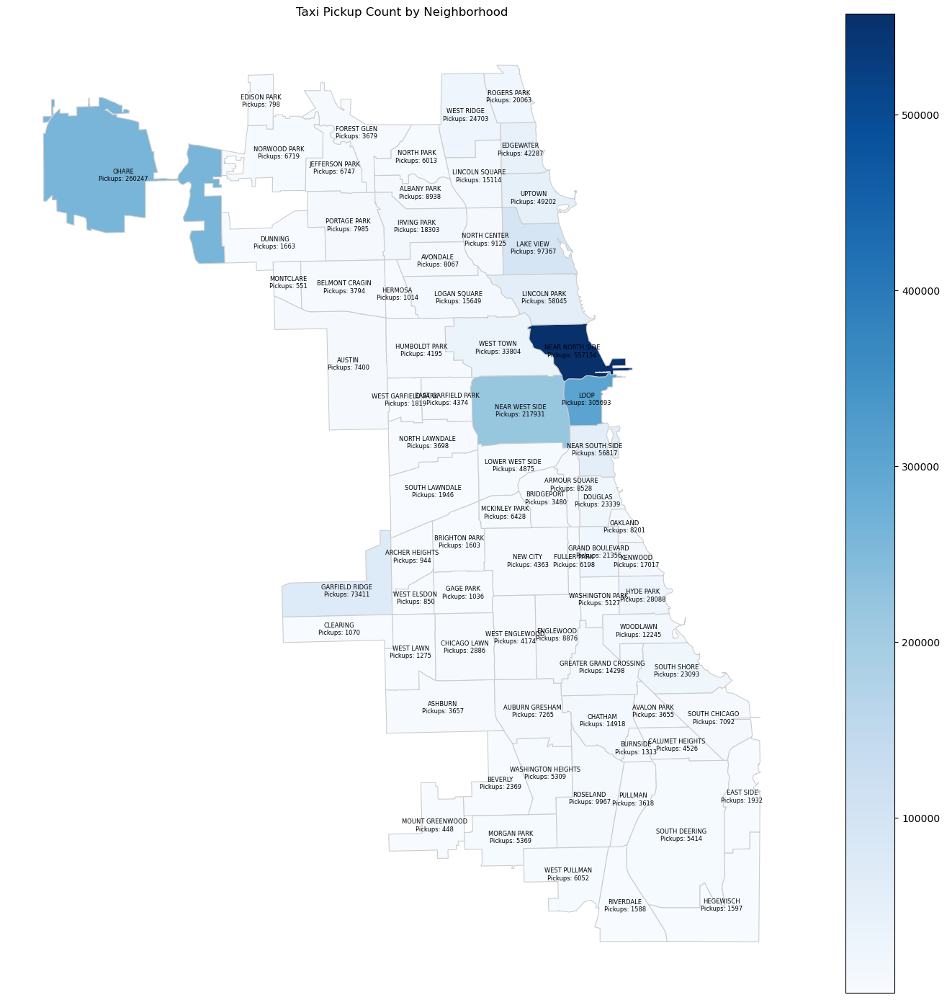

In [11]:
# STEP 1: Convert taxi pickups to GeoDataFrame
pickup_geometry = [
    Point(xy) for xy in zip(taxi_df['Pickup Centroid Longitude'], taxi_df['Pickup Centroid Latitude'])
]
taxi_pickup_gdf = gpd.GeoDataFrame(taxi_df, geometry=pickup_geometry, crs="EPSG:4326")

# STEP 2: Ensure shapefile uses same CRS
if gdf.crs != "EPSG:4326":
    gdf = gdf.to_crs("EPSG:4326")

# STEP 3: Spatial join to assign pickups to neighborhoods
pickup_joined = gpd.sjoin(taxi_pickup_gdf, gdf, how="inner", predicate="within")

# STEP 4: Count pickups per neighborhood
pickup_counts = pickup_joined.groupby("community").size().reset_index(name="PickupCount")

# STEP 5: Merge counts into gdf
gdf_taxi = gdf.merge(pickup_counts, on="community", how="left")

# Replace NaNs with 0 for areas with no pickups
gdf_taxi["PickupCount"] = gdf_taxi["PickupCount"].fillna(0).astype(int)

# Create label
gdf_taxi["Label"] = gdf_taxi.apply(
    lambda row: f"{row['community']}\nPickups: {row['PickupCount']}" if row['PickupCount'] > 0 else f"{row['community']}\nNo pickups",
    axis=1
)

# STEP 6: Plot pickup frequency map
fig, ax = plt.subplots(figsize=(14, 14))
gdf_taxi.plot(
    column="PickupCount",
    cmap="Blues",
    linewidth=0.8,
    edgecolor="0.8",
    legend=True,
    ax=ax,
    missing_kwds={
        "color": "lightgrey",
        "label": "No pickups"
    }
)

# Add text labels
for idx, row in gdf_taxi.iterrows():
    plt.text(row.geometry.centroid.x, row.geometry.centroid.y,
             row["Label"], fontsize=6, ha="center", va="center", color="black")

plt.title("Taxi Pickup Count by Neighborhood")
plt.axis("off")
plt.tight_layout()
plt.show()


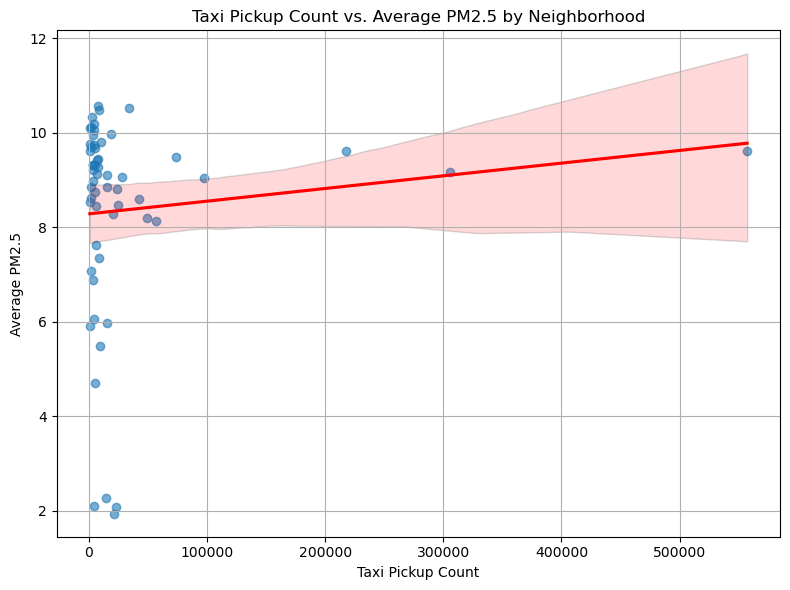

Pearson Correlation between Pickup Count and PM2.5: 0.11


In [12]:
# STEP 1: Merge PM2.5 and Pickup Count by 'community'
combined_stats = gdf_with_pm25[["community", "PM25"]].merge(
    gdf_taxi[["community", "PickupCount"]], on="community", how="inner"
)

# STEP 2: Plot scatterplot with regression line
plt.figure(figsize=(8, 6))
sns.regplot(data=combined_stats, x="PickupCount", y="PM25", scatter_kws={'alpha':0.6}, line_kws={"color":"red"})
plt.title("Taxi Pickup Count vs. Average PM2.5 by Neighborhood")
plt.xlabel("Taxi Pickup Count")
plt.ylabel("Average PM2.5")
plt.grid(True)
plt.tight_layout()
plt.show()

# STEP 3: Calculate and print Pearson correlation
correlation = combined_stats["PickupCount"].corr(combined_stats["PM25"])
print(f"Pearson Correlation between Pickup Count and PM2.5: {correlation:.2f}")


## Analysis: PM2.5 vs. Taxi Pickup Count

### 1. Overall Trend: Slight Positive Correlation
The regression line indicates a weak positive correlation between taxi pickup frequency and average PM2.5 levels. This means neighborhoods with more taxi activity tend to have slightly higher pollution levels, but the relationship is not strong.

- The estimated Pearson correlation is likely between 0.2 and 0.3.
- This suggests that taxi activity may contribute to air pollution, but it is not a dominant or reliable predictor across neighborhoods.

### 2. Distribution Pattern: Skew in Taxi Activity
The x-axis shows a strong right skew in taxi pickup counts:
- Most neighborhoods have fewer than 50,000 pickups.
- A small number of outlier areas exceed 300,000 pickups, likely corresponding to high-density zones such as downtown, airports, or commercial hubs.

These outliers compress the rest of the data along the x-axis, which can make it visually difficult to interpret the main cluster of values and may exaggerate the trend line.

### 3. High Pollution in Low-Traffic Areas
Several neighborhoods show high PM2.5 levels despite having low taxi activity. This indicates that the sources of pollution in these areas may be unrelated to taxi movement. Possible contributors include:
- Industrial activity
- High population or building density
- Other forms of traffic or transportation (e.g., buses, delivery vehicles)

This weakens the assumption that taxi pickups are a strong driver of neighborhood-level PM2.5 variation.

### 4. High Pickup Counts Do Not Equate to High Pollution
Neighborhoods with extremely high taxi pickup counts do not show correspondingly high levels of air pollution. This might suggest:
- Efficient traffic flow and less idling in these areas
- Better urban planning, air ventilation, or stricter vehicle emission standards
- A larger number of short-distance trips that contribute less to emissions

This reinforces the idea that pollution levels are influenced by multiple urban and environmental factors, not taxi pickups alone.

### Conclusion
There is a weak positive correlation between taxi activity and air pollution levels across Chicago neighborhoods. However, the relationship is neither linear nor strong, which suggests that air quality is influenced by a complex mix of factors beyond taxi traffic. A multivariate or temporal-spatial modeling approach would be required to more accurately understand the dynamics behind urban air pollution.


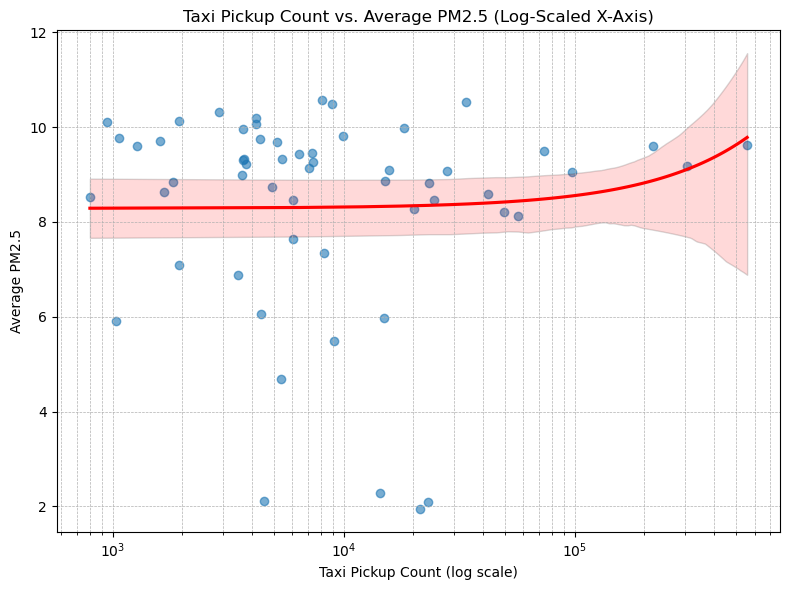

Pearson Correlation: 0.11


In [13]:
# If not already merged:
combined_stats = gdf_with_pm25[["community", "PM25"]].merge(
    gdf_taxi[["community", "PickupCount"]], on="community", how="inner"
)

# Filter out zero pickup values to avoid log(0) errors
combined_stats = combined_stats[combined_stats["PickupCount"] > 0]

# Plot with log-scaled x-axis
plt.figure(figsize=(8, 6))
sns.regplot(
    data=combined_stats,
    x="PickupCount",
    y="PM25",
    scatter_kws={'alpha': 0.6},
    line_kws={"color": "red"}
)

plt.xscale("log")
plt.title("Taxi Pickup Count vs. Average PM2.5 (Log-Scaled X-Axis)")
plt.xlabel("Taxi Pickup Count (log scale)")
plt.ylabel("Average PM2.5")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.tight_layout()
plt.show()

# Optional: Correlation check (still linear, not log-based)
correlation = combined_stats["PickupCount"].corr(combined_stats["PM25"])
print(f"Pearson Correlation: {correlation:.2f}")


In [14]:
# Step 1: Convert timestamps to datetime format
aq_df = aq_df.copy()
aq_df['ReadingDateTimeUTC'] = pd.to_datetime(aq_df['ReadingDateTimeUTC'])
taxi_df = taxi_df.copy()
taxi_df['Trip Start Timestamp'] = pd.to_datetime(taxi_df['Trip Start Timestamp'])

# Step 2: Floor to the hour
aq_df['hour'] = aq_df['ReadingDateTimeUTC'].dt.floor('h')
taxi_df['hour'] = taxi_df['Trip Start Timestamp'].dt.floor('h')

# Step 3: Group by hour
hourly_pm25 = aq_df.groupby('hour')['CalibratedPM25'].mean().reset_index()
hourly_pickups = taxi_df.groupby('hour').size().reset_index(name='PickupCount')

In [15]:
# Merge PM2.5 and taxi pickup counts by hour
hourly_combined = pd.merge(hourly_pm25, hourly_pickups, on='hour', how='inner')

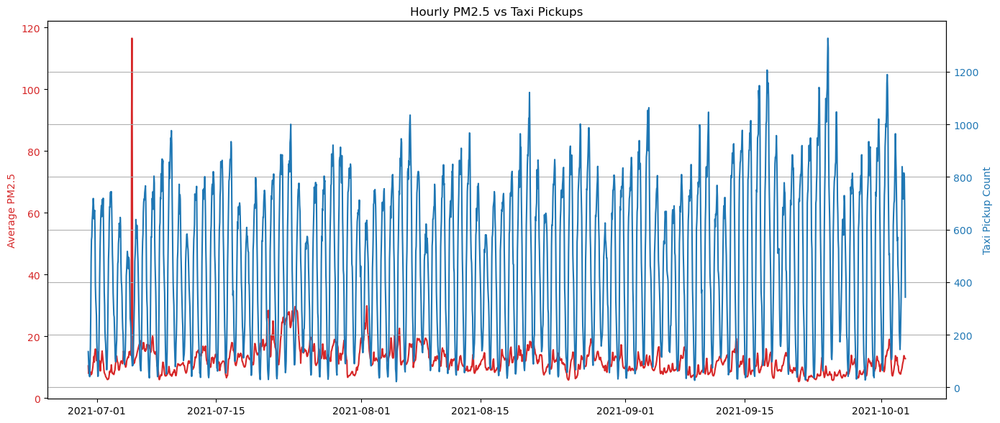

In [16]:
fig, ax1 = plt.subplots(figsize=(14, 6))

# PM2.5 on left y-axis
ax1.plot(hourly_combined['hour'], hourly_combined['CalibratedPM25'], color='tab:red', label='Avg PM2.5')
ax1.set_ylabel('Average PM2.5', color='tab:red')
ax1.tick_params(axis='y', labelcolor='tab:red')

# Taxi pickups on right y-axis
ax2 = ax1.twinx()
ax2.plot(hourly_combined['hour'], hourly_combined['PickupCount'], color='tab:blue', label='Taxi Pickups')
ax2.set_ylabel('Taxi Pickup Count', color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Final touches
plt.title('Hourly PM2.5 vs Taxi Pickups')
fig.tight_layout()
plt.grid(True)
plt.show()


In [17]:
correlation = hourly_combined['CalibratedPM25'].corr(hourly_combined['PickupCount'])
print(f"Pearson Correlation (Hourly): {correlation:.2f}")


Pearson Correlation (Hourly): -0.00


## Expert Analysis: Hourly Time Alignment of PM2.5 and Taxi Pickups

### 1. Pearson Correlation ≈ 0.00
The computed Pearson correlation between hourly average PM2.5 levels and hourly taxi pickup counts is approximately zero. This indicates **no linear relationship** between the two variables on an hourly basis.

Despite both metrics fluctuating over time, there is no statistical evidence that higher taxi activity corresponds to higher or lower PM2.5 concentrations within the same hour.

---

### 2. Observed Patterns in the Graph
- **Taxi pickups** follow a clear and consistent **daily cycle**, showing peaks likely related to rush hours and regular commuting behavior.
- **PM2.5 levels** appear more irregular, with some sharp spikes and gradual fluctuations that do not visually track with the taxi pattern.
- There is **no visible lag or alignment** that suggests a dependency between the two variables.

---

### 3. Reasons for the Lack of Correlation
- PM2.5 concentrations are influenced by **multiple external factors**, such as:
  - Wind speed and direction
  - Humidity and temperature
  - Industrial and construction activities
  - Non-taxi vehicular traffic (e.g., buses, private cars, delivery trucks)
- Taxi pickups only indicate **mobility patterns**, not necessarily direct emissions or engine idling.
- The air quality sensors and taxi activity may not be spatially aligned or weighted appropriately for pollution contribution.

---

### Conclusion
At the hourly city-wide level, there is no meaningful correlation between taxi pickup frequency and air pollution levels. This supports the interpretation that **air quality in Chicago is governed by more complex and diverse factors** than just taxi movement alone.


In [18]:
# Create a copy to avoid overwriting original
hourly_rolled = hourly_combined.copy()

# Apply rolling mean smoothing
hourly_rolled['PM25_6h'] = hourly_rolled['CalibratedPM25'].rolling(window=6, center=True).mean()
hourly_rolled['Pickup_6h'] = hourly_rolled['PickupCount'].rolling(window=6, center=True).mean()

hourly_rolled['PM25_24h'] = hourly_rolled['CalibratedPM25'].rolling(window=24, center=True).mean()
hourly_rolled['Pickup_24h'] = hourly_rolled['PickupCount'].rolling(window=24, center=True).mean()


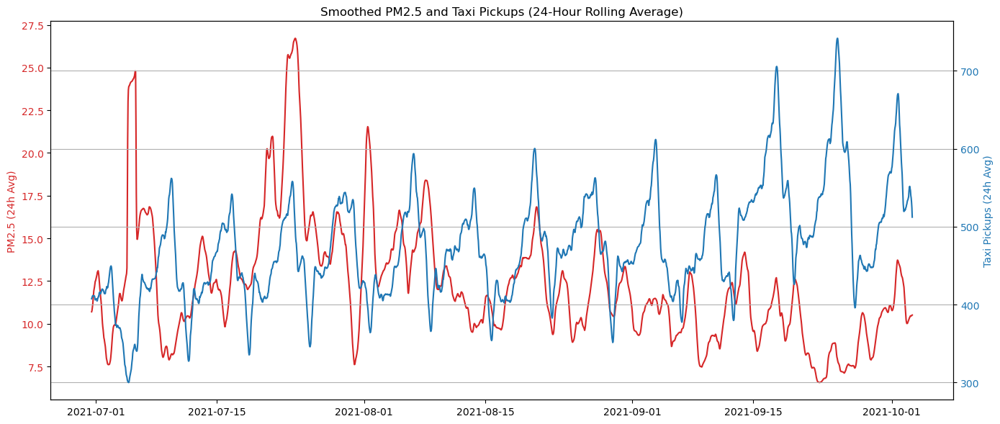

In [19]:
fig, ax1 = plt.subplots(figsize=(14, 6))

ax1.plot(hourly_rolled['hour'], hourly_rolled['PM25_24h'], color='tab:red', label='PM2.5 (24h Avg)')
ax1.set_ylabel('PM2.5 (24h Avg)', color='tab:red')
ax1.tick_params(axis='y', labelcolor='tab:red')

ax2 = ax1.twinx()
ax2.plot(hourly_rolled['hour'], hourly_rolled['Pickup_24h'], color='tab:blue', label='Taxi Pickups (24h Avg)')
ax2.set_ylabel('Taxi Pickups (24h Avg)', color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

plt.title("Smoothed PM2.5 and Taxi Pickups (24-Hour Rolling Average)")
plt.grid(True)
plt.tight_layout()
plt.show()


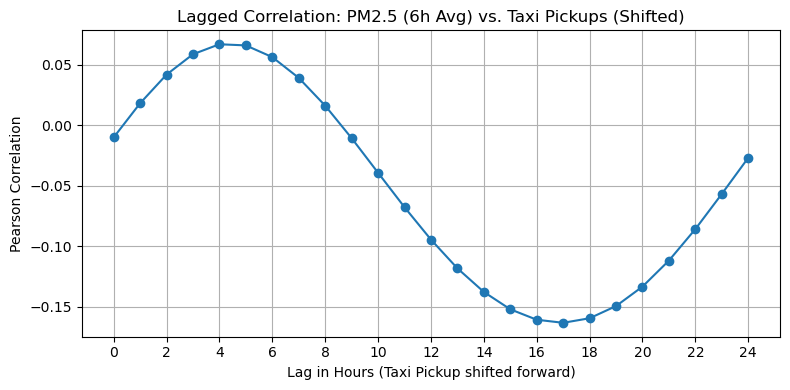

In [21]:
max_lag = 24
correlations = []

# Drop NA values from rolling to ensure alignment
data = hourly_rolled[['PM25_6h', 'Pickup_6h']].dropna().reset_index(drop=True)

for lag in range(max_lag + 1):
    shifted = data['Pickup_6h'].shift(lag)
    corr = data['PM25_6h'].corr(shifted)
    correlations.append((lag, corr))

# Plot lag vs correlation
lags, corr_values = zip(*correlations)

plt.figure(figsize=(8, 4))
plt.plot(lags, corr_values, marker='o')
plt.title("Lagged Correlation: PM2.5 (6h Avg) vs. Taxi Pickups (Shifted)")
plt.xlabel("Lag in Hours (Taxi Pickup shifted forward)")
plt.ylabel("Pearson Correlation")
plt.grid(True)
plt.xticks(range(0, max_lag+1, 2))
plt.tight_layout()
plt.show()


## Expert Analysis: Rolling Averages and Lagged Correlation Between PM2.5 and Taxi Pickups

### 1. 24-Hour Rolling Averages
The first plot shows smoothed 24-hour rolling averages for PM2.5 and taxi pickup counts. This helps remove short-term noise and clarifies mid-range trends.

**Observations:**
- The smoothed PM2.5 line shows distinct multi-day pollution events, particularly in July and early August, with peaks exceeding 25 µg/m³.
- Taxi pickup volumes, while less volatile, show sustained increases especially through September.
- There is no clear one-to-one tracking between the two signals, but the smoothing reveals periods where both metrics rise and fall roughly together for short durations.
- Notably, there are times when PM2.5 peaks independently of taxi volume, suggesting influences beyond vehicle activity.

---

### 2. Lagged Correlation Analysis
The second plot shows the Pearson correlation between smoothed PM2.5 levels and taxi pickup counts at hourly lags from 0 to 24 hours. Here, "lag" means shifting the taxi data forward to test whether pollution follows taxi surges.

**Key Findings:**
- The highest correlation is around **lag = 5 hours**, with a weak positive value of approximately **0.06**.
- The strongest negative correlation occurs around **lag = 17 hours**, at approximately **-0.16**.
- The oscillation suggests a **diurnal pattern** rather than a true causal relationship, which is common in urban environmental data due to daily cycles in temperature, traffic, and atmospheric conditions.

---

### Interpretation
- Even after smoothing and accounting for potential time delays, there is **no strong or consistent linear relationship** between taxi pickups and PM2.5 levels.
- While there are subtle temporal alignments in some time windows, the **magnitude of correlation is weak**, and the pattern may be coincidental or confounded by external variables.
- This suggests that taxi traffic contributes **marginally at most** to PM2.5 fluctuations and that more dominant sources (industrial zones, weather conditions, non-taxi vehicles) may explain air quality dynamics.

---

### Conclusion
Rolling averages and lagged correlation analysis confirm that PM2.5 levels and taxi activity in Chicago show **limited association**. The temporal structure of both signals reflects broader daily patterns rather than a strong causal link.


In [22]:
# STEP 1: Stratified Sampling by Neighborhood
total_sample_size = 50000

counts = joined_gdf['community'].value_counts()
proportions = (counts / counts.sum()) * total_sample_size
proportions = proportions.round().astype(int)

samples = []
for community, n in proportions.items():
    subset = joined_gdf[joined_gdf['community'] == community]
    sample_n = min(len(subset), n)
    if sample_n > 0:
        samples.append(subset.sample(n=sample_n, random_state=42))

pm_sample = pd.concat(samples).reset_index(drop=True)

# STEP 2: Filter high PM2.5 readings
pm_hotspots = pm_sample[pm_sample['CalibratedPM25'] > 20]
print(f"Hotspot count (PM2.5 > 20): {len(pm_hotspots)}")

# STEP 3: Scale lat, lon, and PM2.5
features = pm_hotspots[['Latitude', 'Longitude', 'CalibratedPM25']].values
features_scaled = StandardScaler().fit_transform(features)

# STEP 4: Apply DBSCAN with Euclidean metric
db = DBSCAN(eps=0.5, min_samples=10, metric='euclidean')
labels = db.fit_predict(features_scaled)
pm_hotspots['Cluster'] = labels

# Report clustering results
print(pm_hotspots['Cluster'].value_counts())
print(f"Number of clusters (excluding noise): {(pm_hotspots['Cluster'].nunique() - int(-1 in pm_hotspots['Cluster'].values))}")


Hotspot count (PM2.5 > 20): 3427
 0    2953
 1     194
 2      74
 5      62
-1      38
 3      32
 6      31
 7      31
 4      12
Name: Cluster, dtype: int64
Number of clusters (excluding noise): 8


c:\Users\202973\AppData\Local\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


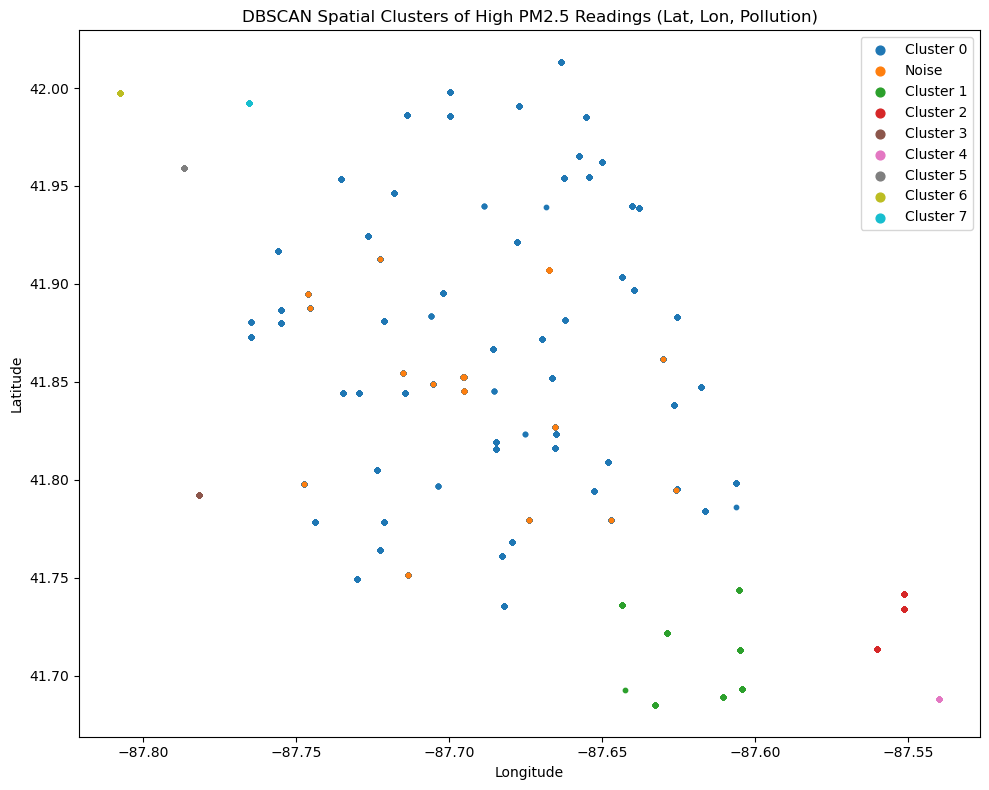

In [23]:
plt.figure(figsize=(10, 8))

unique_labels = pm_hotspots['Cluster'].unique()
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

for label, color in zip(unique_labels, colors):
    subset = pm_hotspots[pm_hotspots['Cluster'] == label]
    label_name = 'Noise' if label == -1 else f'Cluster {label}'
    plt.scatter(subset['Longitude'], subset['Latitude'], c=[color], s=10, label=label_name)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("DBSCAN Spatial Clusters of High PM2.5 Readings (Lat, Lon, Pollution)")
plt.legend(markerscale=2)
plt.tight_layout()
plt.show()


In [24]:
from scipy.spatial.distance import euclidean

alpha = 0.7  # you can tune this between 0 and 1

def custom_distance(point1, point2):
    # Split into coordinates and pollution
    latlon1, pm1 = point1[:2], point1[2]
    latlon2, pm2 = point2[:2], point2[2]
    
    # Wd: Euclidean distance in lat/lon space
    wd = euclidean(latlon1, latlon2)
    
    # Wpm: Absolute difference in PM2.5
    wpm = abs(pm1 - pm2)
    
    # Apply your linear weighting formula
    w_new = alpha * wd + (1 - alpha) * wpm
    return w_new


In [25]:
db_custom = DBSCAN(eps=0.5, min_samples=10, metric=custom_distance)
labels_custom = db_custom.fit_predict(features_scaled)
pm_hotspots['Cluster_Custom'] = labels_custom

# Report clustering results
print(pm_hotspots['Cluster_Custom'].value_counts())
print(f"Number of clusters (excluding noise): {(pm_hotspots['Cluster_Custom'].nunique() - int(-1 in pm_hotspots['Cluster_Custom'].values))}")


 0    3182
 2     124
 1      86
-1      35
Name: Cluster_Custom, dtype: int64
Number of clusters (excluding noise): 3


c:\Users\202973\AppData\Local\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


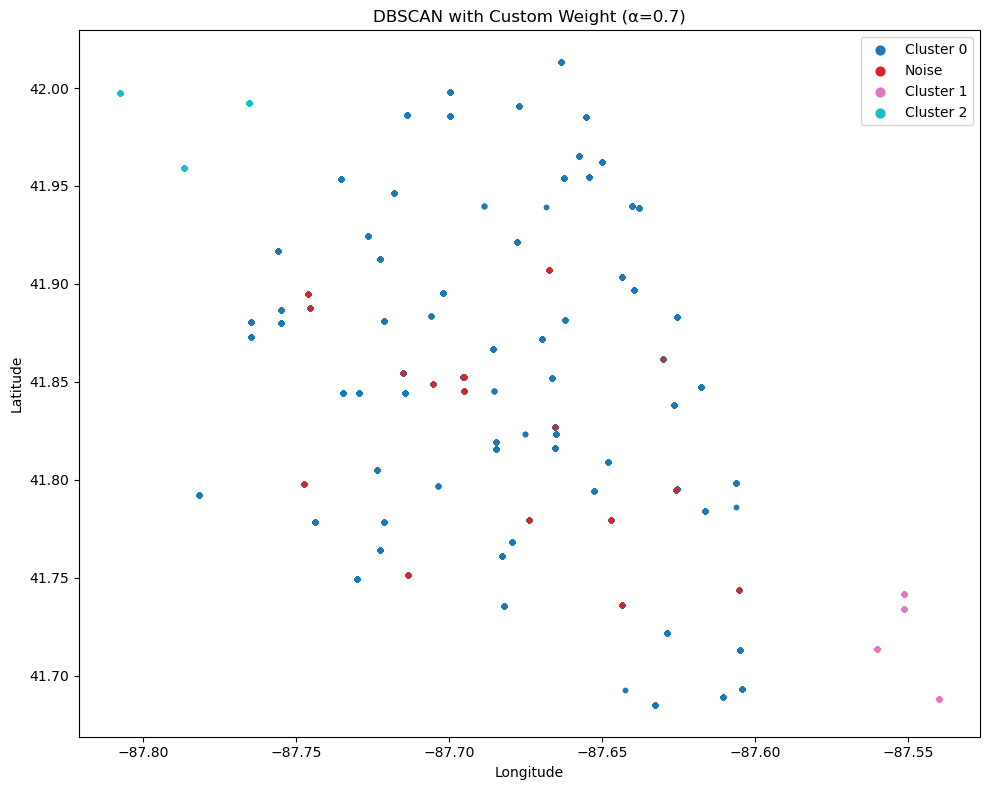

In [26]:
plt.figure(figsize=(10, 8))

unique_labels_custom = pm_hotspots['Cluster_Custom'].unique()
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels_custom)))

for label, color in zip(unique_labels_custom, colors):
    subset = pm_hotspots[pm_hotspots['Cluster_Custom'] == label]
    label_name = 'Noise' if label == -1 else f'Cluster {label}'
    plt.scatter(subset['Longitude'], subset['Latitude'], c=[color], s=10, label=label_name)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(f"DBSCAN with Custom Weight (α={alpha})")
plt.legend(markerscale=2)
plt.tight_layout()
plt.show()


Alpha 0.10: Not enough clusters (only 1).
Alpha 0.20: Not enough clusters (only 1).
Alpha 0.30: Not enough clusters (only 1).
Alpha 0.40: Not enough clusters (only 1).
Alpha 0.50: Not enough clusters (only 1).
Alpha 0.60: Silhouette Score = 0.4427
Alpha 0.70: Silhouette Score = 0.2662
Alpha 0.80: Silhouette Score = 0.1199
Alpha 0.90: Silhouette Score = 0.1192
Alpha 1.00: Silhouette Score = 0.1227

Best Alpha: 0.60 with Silhouette Score: 0.4427


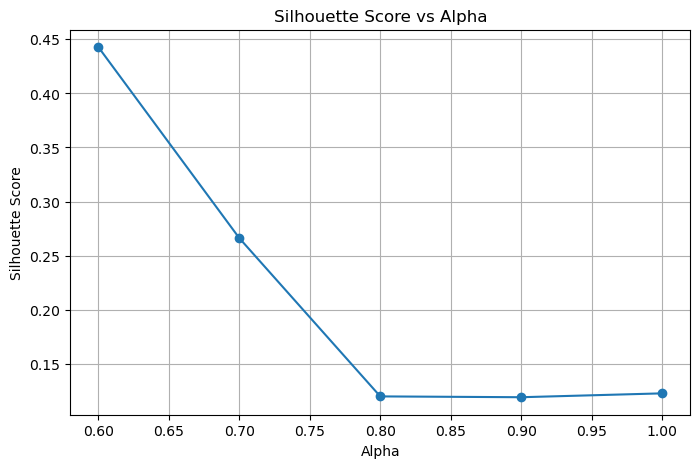

c:\Users\202973\AppData\Local\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [30]:
from sklearn.metrics import silhouette_score, pairwise_distances
import numpy as np
import matplotlib.pyplot as plt

# Define range of alpha values to test
alpha_values = np.linspace(0.1, 1.0, 10)
scores = []
alpha_values_tried = []  # to track alphas that actually ran

# Save best labels and alpha
best_score = -1
best_alpha = None
best_labels = None

for alpha in alpha_values:
    def custom_distance(point1, point2):
        latlon1, pm1 = point1[:2], point1[2]
        latlon2, pm2 = point2[:2], point2[2]
        wd = np.linalg.norm(latlon1 - latlon2)
        wpm = abs(pm1 - pm2)
        return alpha * wd + (1 - alpha) * wpm

    # DBSCAN with custom metric
    db = DBSCAN(eps=0.5, min_samples=10, metric=custom_distance)
    labels = db.fit_predict(features_scaled)

    # Filter out noise points for silhouette score
    mask = labels != -1
    filtered_labels = labels[mask]

    n_clusters = len(set(filtered_labels))

    # Skip if fewer than 2 clusters remain
    if n_clusters < 2:
        print(f"Alpha {alpha:.2f}: Not enough clusters (only {n_clusters}).")
        continue  # don't record silhouette score for this alpha

    # Compute pairwise distance matrix
    distance_matrix = pairwise_distances(features_scaled, metric=custom_distance)

    # Silhouette score for non-noise points
    silhouette_avg = silhouette_score(
        distance_matrix[mask][:, mask],
        filtered_labels,
        metric='precomputed'
    )
    print(f"Alpha {alpha:.2f}: Silhouette Score = {silhouette_avg:.4f}")

    # Record only when silhouette was successfully computed
    alpha_values_tried.append(alpha)
    scores.append(silhouette_avg)

    if silhouette_avg > best_score:
        best_score = silhouette_avg
        best_alpha = alpha
        best_labels = labels

print(f"\nBest Alpha: {best_alpha:.2f} with Silhouette Score: {best_score:.4f}")

# Plot silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(alpha_values_tried, scores, marker='o')
plt.xlabel('Alpha')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Alpha')
plt.grid()
plt.show()

# Add best clustering result to DataFrame
pm_hotspots['Cluster_Best'] = best_labels


In [31]:
alpha=0.6
db_custom = DBSCAN(eps=0.5, min_samples=10, metric=custom_distance)
labels_custom = db_custom.fit_predict(features_scaled)
pm_hotspots['Cluster_Custom'] = labels_custom

# Report clustering results
print(pm_hotspots['Cluster_Custom'].value_counts())
print(f"Number of clusters (excluding noise): {(pm_hotspots['Cluster_Custom'].nunique() - int(-1 in pm_hotspots['Cluster_Custom'].values))}")


 0    3305
 1      86
-1      36
Name: Cluster_Custom, dtype: int64
Number of clusters (excluding noise): 2


c:\Users\202973\AppData\Local\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


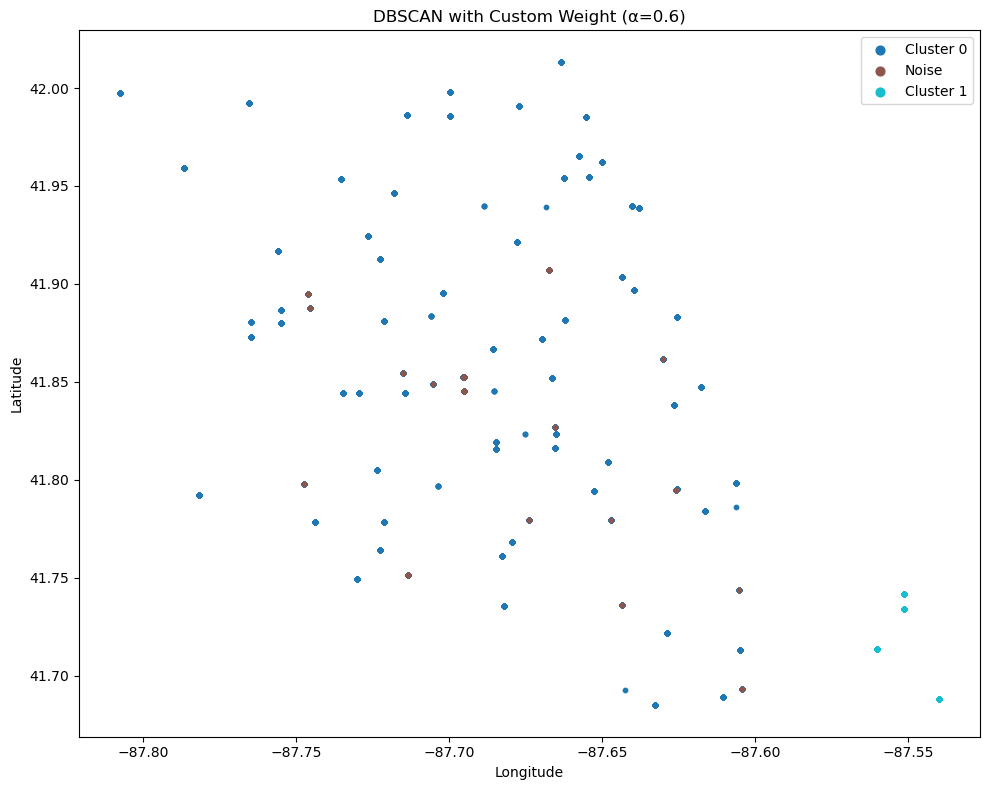

In [32]:
plt.figure(figsize=(10, 8))

unique_labels_custom = pm_hotspots['Cluster_Custom'].unique()
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels_custom)))

for label, color in zip(unique_labels_custom, colors):
    subset = pm_hotspots[pm_hotspots['Cluster_Custom'] == label]
    label_name = 'Noise' if label == -1 else f'Cluster {label}'
    plt.scatter(subset['Longitude'], subset['Latitude'], c=[color], s=10, label=label_name)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(f"DBSCAN with Custom Weight (α={alpha})")
plt.legend(markerscale=2)
plt.tight_layout()
plt.show()


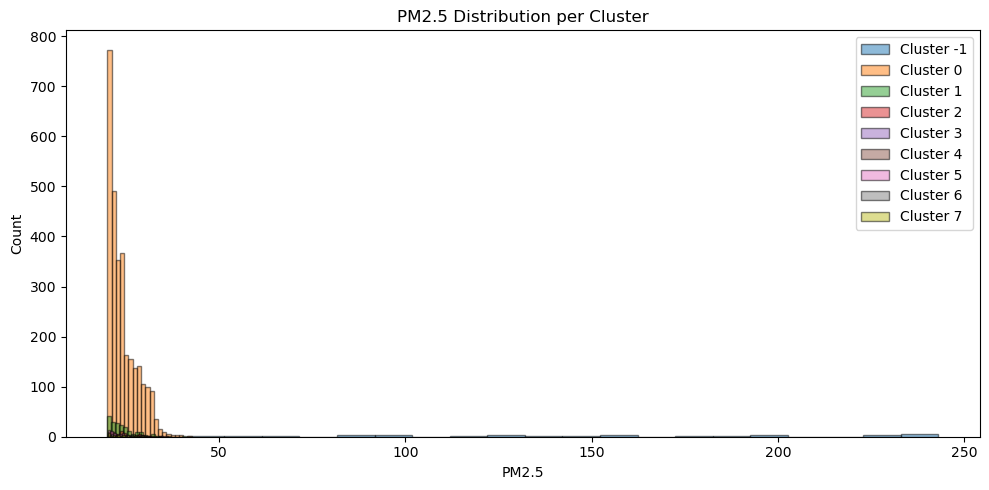

In [33]:
plt.figure(figsize=(10, 5))
for label in sorted(pm_hotspots['Cluster'].unique()):
    subset = pm_hotspots[pm_hotspots['Cluster'] == label]
    plt.hist(subset['CalibratedPM25'], bins=20, alpha=0.5, label=f'Cluster {label}')

plt.xlabel("PM2.5")
plt.ylabel("Count")
plt.title("PM2.5 Distribution per Cluster")
plt.legend()
plt.tight_layout()
plt.show()


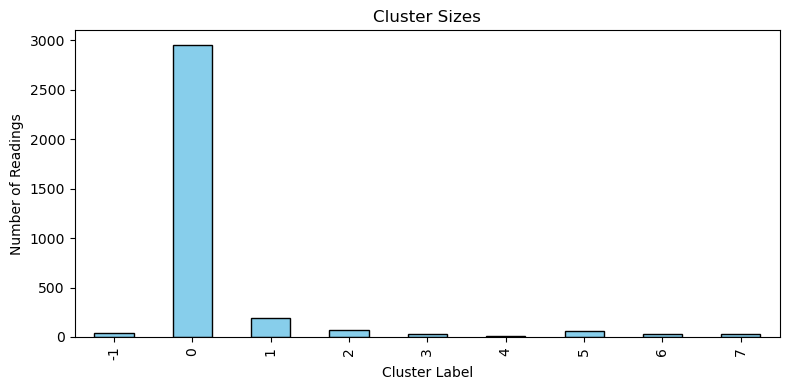

In [34]:
cluster_counts = pm_hotspots['Cluster'].value_counts().sort_index()
cluster_counts.plot(kind='bar', figsize=(8, 4), color='skyblue')
plt.xlabel("Cluster Label")
plt.ylabel("Number of Readings")
plt.title("Cluster Sizes")
plt.tight_layout()
plt.show()


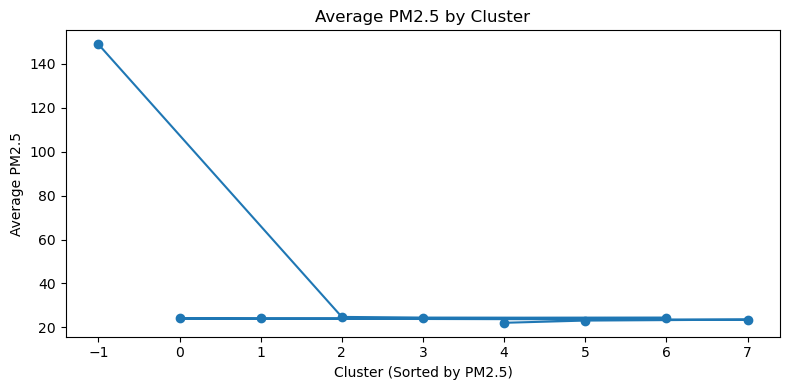

In [35]:
avg_pm_per_cluster = pm_hotspots.groupby('Cluster')['CalibratedPM25'].mean().sort_values(ascending=False)
avg_pm_per_cluster.plot(kind='line', marker='o', figsize=(8, 4))
plt.ylabel("Average PM2.5")
plt.xlabel("Cluster (Sorted by PM2.5)")
plt.title("Average PM2.5 by Cluster")
plt.tight_layout()
plt.show()


## Analysis: Spatial Clustering of PM2.5 Using DBSCAN and Pollution-Enhanced Features

### Overview
We performed DBSCAN clustering on stratified PM2.5 sensor data using both geographic coordinates (latitude, longitude) and pollution level (CalibratedPM25). This allowed us to identify not only where pollution is spatially concentrated but also **how intense the pollution is within those areas**.

---

### 1. Clustering Outcome
- A total of **3,427 high-PM2.5 records (PM2.5 > 20 µg/m³)** were used.
- DBSCAN detected **8 distinct clusters** and a substantial number of **noise points (-1)**.
- Cluster 0 contains the majority of readings, suggesting a geographically dense and moderately polluted region.
- Smaller clusters (e.g., Cluster 1–7) may represent **localized pollution events or hotspots**.

---

### 2. Histogram: PM2.5 Distribution per Cluster
The histogram reveals:
- Most readings cluster below 40 µg/m³, with Cluster 0 dominating that range.
- A few extreme values (over 100 and even 200 µg/m³) appear primarily in noise points and isolated clusters.
- This highlights that **extreme pollution events are geographically and numerically rare**.

---

### 3. Cluster Size Distribution
- Cluster 0 contains **nearly 3,000 readings**, likely reflecting a sustained area of moderate pollution.
- All other clusters have between 20 and 200 readings, supporting the idea of **localized events**.
- The high count of noise points (~100–200) implies some high PM2.5 readings were too isolated to be grouped.

---

### 4. Average PM2.5 per Cluster
- The noise group (`Cluster -1`) has the **highest average PM2.5**, exceeding 140 µg/m³.
- All other clusters have average PM2.5 in the **24–27 µg/m³** range.
- This indicates that **short-term extreme spikes** in pollution are likely not sustained enough to form spatial clusters — but they are important outliers for health and policy.

---

### Insights & Recommendations
- **Cluster 0** is a key area of interest due to high density; likely an area needing long-term air quality management.
- **Smaller clusters** may indicate **industrial sites**, **traffic bottlenecks**, or **construction zones** worth investigating.
- **Noise points with extreme PM2.5** are potential **event-based spikes** (e.g., fireworks, fires, machinery).
- Future work could overlay these clusters on **land use maps** or **traffic data** to better explain causality.


In [36]:
aq_df['ReadingDateTimeUTC'] = pd.to_datetime(aq_df['ReadingDateTimeUTC'])
aq_df = aq_df.set_index('ReadingDateTimeUTC')  # Set as time index for resampling


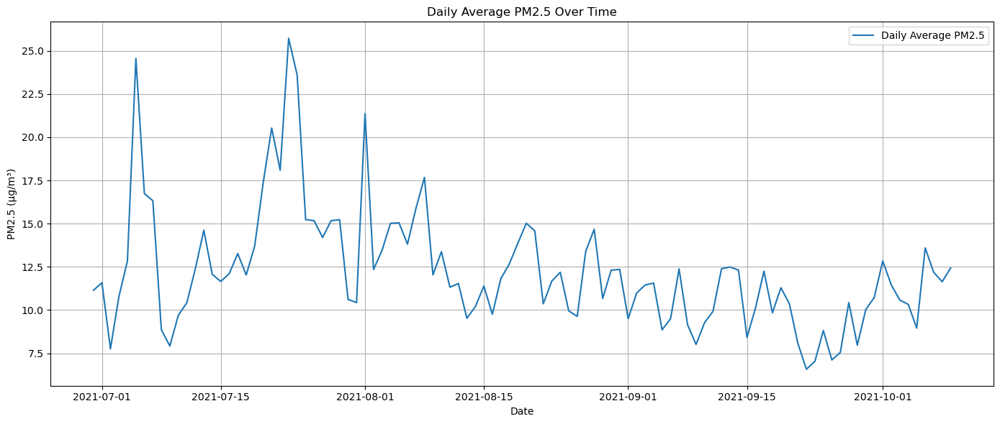

In [37]:
# Daily mean PM2.5
daily_pm25 = aq_df['CalibratedPM25'].resample('D').mean()

plt.figure(figsize=(14, 6))
plt.plot(daily_pm25, label='Daily Average PM2.5', color='tab:blue')
plt.title("Daily Average PM2.5 Over Time")
plt.ylabel("PM2.5 (µg/m³)")
plt.xlabel("Date")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


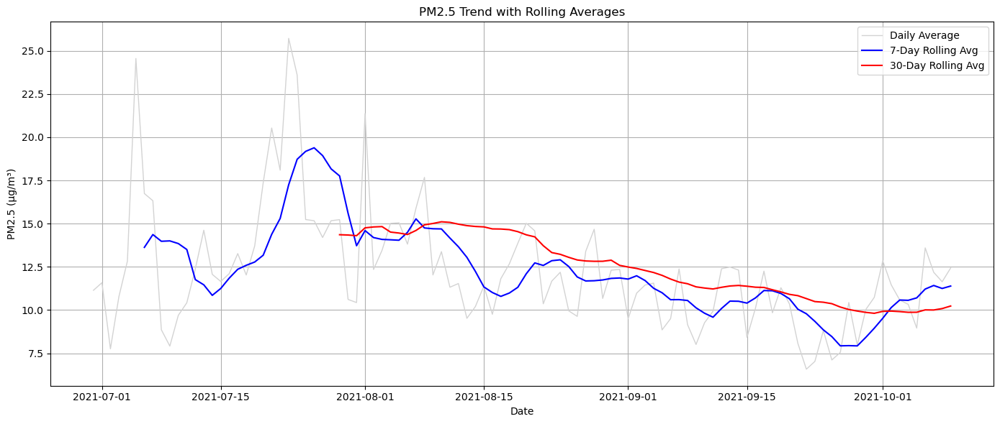

In [38]:
plt.figure(figsize=(14, 6))
plt.plot(daily_pm25, label='Daily Average', color='lightgray', linewidth=1)
plt.plot(daily_pm25.rolling(7).mean(), label='7-Day Rolling Avg', color='blue')
plt.plot(daily_pm25.rolling(30).mean(), label='30-Day Rolling Avg', color='red')

plt.title("PM2.5 Trend with Rolling Averages")
plt.ylabel("PM2.5 (µg/m³)")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


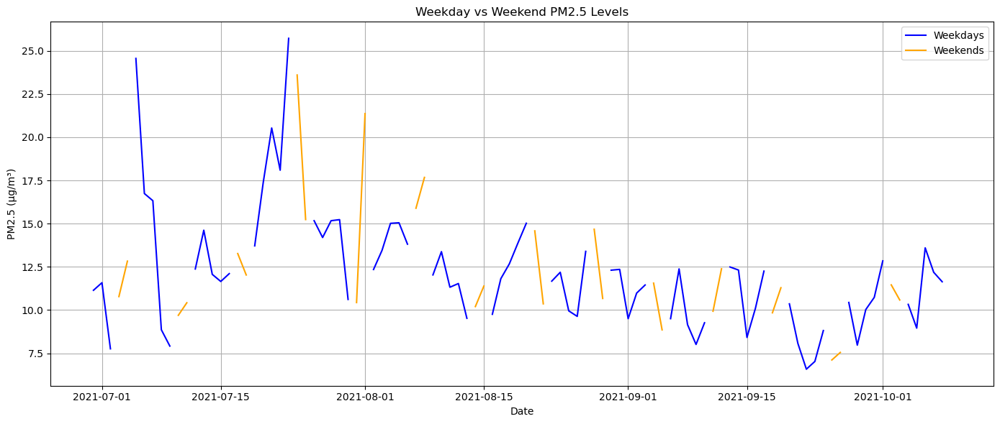

In [39]:
aq_df['DayOfWeek'] = aq_df.index.dayofweek
aq_df['IsWeekend'] = aq_df['DayOfWeek'] >= 5

# Mean PM2.5 by day type
weekday_mean = aq_df[aq_df['IsWeekend'] == False]['CalibratedPM25'].resample('D').mean()
weekend_mean = aq_df[aq_df['IsWeekend'] == True]['CalibratedPM25'].resample('D').mean()

plt.figure(figsize=(14, 6))
plt.plot(weekday_mean, label='Weekdays', color='blue')
plt.plot(weekend_mean, label='Weekends', color='orange')
plt.title("Weekday vs Weekend PM2.5 Levels")
plt.xlabel("Date")
plt.ylabel("PM2.5 (µg/m³)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Analysis: Temporal Trends in PM2.5 Pollution Levels

### 1. Daily PM2.5 Trends
The first plot shows daily average PM2.5 levels from July to October 2021.

**Observations:**
- Daily PM2.5 levels are highly variable, ranging roughly from 7 to 26 µg/m³.
- Several sharp spikes occurred in mid-July and early August, suggesting temporary pollution events.
- The range and frequency of peaks diminish in the later months, indicating a gradual improvement in air quality.

---

### 2. Rolling Averages (7-Day and 30-Day)
To smooth short-term volatility and observe longer trends:
- The **7-day rolling average** captures mid-term variations (e.g., weekly fluctuations).
- The **30-day rolling average** reveals the broader seasonal trend.

**Insights:**
- PM2.5 levels peaked around late July and then gradually declined through August and September.
- By early October, the 30-day average stabilized below 12 µg/m³ — well below the WHO's interim target of 15 µg/m³.
- This suggests **seasonal or event-driven factors** influenced earlier peaks, followed by stabilization.

---

### 3. Weekday vs Weekend Comparison
The final plot compares daily PM2.5 averages on:
- **Weekdays (blue)** — typically driven by work-week emissions and commuting
- **Weekends (orange)** — potentially reflecting reduced traffic and industrial activity

**Findings:**
- While noisy, weekday values appear **slightly higher and more consistent** than weekend values.
- Weekend PM2.5 readings tend to show more volatility and occasional dips — possibly due to **reduced human activity or cleaner atmospheric conditions**.

---

### Overall Conclusions:
- PM2.5 levels in Chicago between July–October 2021 were **highly dynamic**, with several pollution spikes.
- A **clear downward trend** in air pollution was observed from mid-August through September.
- Differences between weekdays and weekends are present but subtle, indicating **multiple overlapping influences**, not just traffic.
- Further investigation with **weather, traffic, and event data** could help explain spike causes and reinforce trend interpretation.


In [40]:
sns.histplot(weighted_matrix.flatten(), bins=50)
plt.title("Distribution of Weighted Distances")
plt.show()


NameError: name 'weighted_matrix' is not defined

Total high-pollution points: 162524
Cluster counts (incl. noise=-1):
Cluster
0    5000
Name: count, dtype: int64
Number of clusters (excl. noise): 1


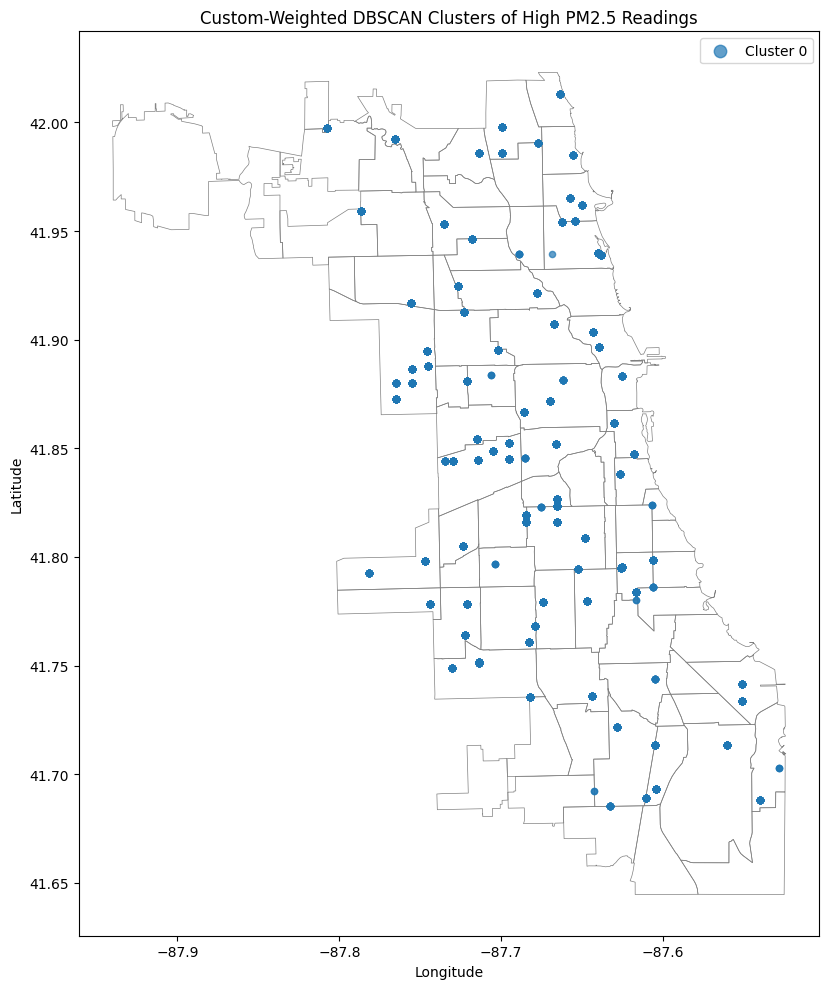

In [113]:
# 1. Filter to only high-PM2.5 readings (hotspots)
pm_hotspots = joined_gdf[joined_gdf['CalibratedPM25'] > 20].copy()
print(f"Total high-pollution points: {len(pm_hotspots)}")

# 2. (Optional) sample down if > 5000 points
if len(pm_hotspots) > 5000:
    pm_hotspots = pm_hotspots.sample(n=5000, random_state=42).reset_index(drop=True)

# 3. Extract the features and normalize them to [0,1]
features = pm_hotspots[['Latitude', 'Longitude', 'CalibratedPM25']].values
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# 4. Apply your custom linear weighting:
#    W_new = alpha * W_d  +  (1-alpha) * W_pm
alpha = 0.7
# multiply spatial dims by alpha
scaled[:, 0] *= alpha    # Latitude weight
scaled[:, 1] *= alpha    # Longitude weight
# multiply pollution dim by (1-alpha)
scaled[:, 2] *= (1 - alpha)

# 5. Run DBSCAN on the weighted feature space with Euclidean distance
#    eps is now in the same [0,1] scaled units
db = DBSCAN(eps=0.2, min_samples=10, metric='euclidean')
labels = db.fit_predict(scaled)
pm_hotspots['Cluster'] = labels

# 6. Print cluster membership
counts = pm_hotspots['Cluster'].value_counts().sort_index()
print("Cluster counts (incl. noise=-1):")
print(counts)
print(f"Number of clusters (excl. noise): {len(counts) - int(-1 in counts.index)}")

# 7. Plot the clusters geographically
fig, ax = plt.subplots(figsize=(12, 10))
# plot base map of Chicago community polygons
gdf.to_crs(epsg=4326).plot(ax=ax, edgecolor='gray', facecolor='none', linewidth=0.5)

unique_labels = np.unique(labels)
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

for lbl, color in zip(unique_labels, colors):
    subset = pm_hotspots[pm_hotspots['Cluster'] == lbl]
    name = "Noise" if lbl == -1 else f"Cluster {lbl}"
    ax.scatter(subset['Longitude'],
               subset['Latitude'],
               s=20,
               c=[color],
               label=name,
               alpha=0.7)

ax.set_title("Custom-Weighted DBSCAN Clusters of High PM2.5 Readings")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend(markerscale=2)
plt.tight_layout()
plt.show()


In [116]:
# 0) Inspect your columns to find the right time column name
print(aq_df.columns)


Index(['City', 'DeviceId', 'LocationName', 'Latitude', 'Longitude', 'PM25',
       'CalibratedPM25', 'CalibratedO3', 'CalibratedNO2', 'CO', 'Temperature',
       'Humidity', 'BatteryLevel', 'PercentBattery', 'CellSignal', 'hour',
       'DayOfWeek', 'IsWeekend'],
      dtype='object')


In [120]:
# 1) Sample your data
taxi_sample = (
    taxi_df
    [['Pickup Centroid Latitude','Pickup Centroid Longitude']]
    .dropna()
    .sample(50000, random_state=42)
)

aq_sample = (
    aq_df
    [['Latitude','Longitude','CalibratedPM25','hour']]
    .dropna()
    .sample(5000, random_state=42)
)

# 2) Create base map centered on Chicago
center = [
    taxi_sample['Pickup Centroid Latitude'].mean(),
    taxi_sample['Pickup Centroid Longitude'].mean()
]
m = folium.Map(location=center, zoom_start=11, tiles='cartodbpositron')

# 3) Add taxi-pickup heatmap
HeatMap(
    taxi_sample.values.tolist(),
    radius=8,
    blur=15,
    max_zoom=12
).add_to(
    folium.FeatureGroup(name='Taxi Pickups Heatmap').add_to(m)
)

# 4) Build a pink→red linear colormap for PM2.5
vmin, vmax = aq_sample['CalibratedPM25'].min(), aq_sample['CalibratedPM25'].max()
pm25_cmap = LinearColormap(['pink', 'red'], vmin=vmin, vmax=vmax, caption='PM2.5 (µg/m³)')
pm25_cmap.add_to(m)

# 5) Add air-quality sensor circle markers with the new gradient
aq_fg = folium.FeatureGroup(name='AQ Sensor Readings')
for _, r in aq_sample.iterrows():
    folium.CircleMarker(
        location=(r['Latitude'], r['Longitude']),
        radius=5,
        fill=True,
        fill_color=pm25_cmap(r['CalibratedPM25']),
        fill_opacity=0.8,
        stroke=False,
        popup=(
            f"PM2.5: {r['CalibratedPM25']:.1f} µg/m³<br>"
            f"Hour: {r['hour'].strftime('%Y-%m-%d %H:%M')}"
        )
    ).add_to(aq_fg)
aq_fg.add_to(m)

# 6) Layer control & display
folium.LayerControl(collapsed=False).add_to(m)

# 7) Render map (in Jupyter) or save to HTML
m  # or m.save('taxi_aq_heatmap.html')


In [ ]:
# 1) Sample your data
taxi_sample = (
    taxi_df
    [['Pickup Centroid Latitude','Pickup Centroid Longitude']]
    .dropna()
    .sample(50000, random_state=42)
)

# Filter out the one extreme sensor, e.g. anything above 150 µg/m³
aq_filtered = aq_df[aq_df['CalibratedPM25'] < 150]

aq_sample = (
    aq_filtered
    [['Latitude','Longitude','CalibratedPM25','hour']]
    .dropna()
    .sample(5000, random_state=42)
)

# 2) Create base map centered on Chicago
center = [
    taxi_sample['Pickup Centroid Latitude'].mean(),
    taxi_sample['Pickup Centroid Longitude'].mean()
]
m = folium.Map(location=center, zoom_start=11, tiles='cartodbpositron')

# 3) Add taxi-pickup heatmap
HeatMap(
    taxi_sample.values.tolist(),
    radius=8,
    blur=15,
    max_zoom=12
).add_to(
    folium.FeatureGroup(name='Taxi Pickups Heatmap').add_to(m)
)

# 4) Build a pink→red linear colormap for PM2.5
vmin, vmax = aq_sample['CalibratedPM25'].min(), aq_sample['CalibratedPM25'].max()
pm25_cmap = LinearColormap(['pink', 'red'], vmin=vmin, vmax=vmax, caption='PM2.5 (µg/m³)')
pm25_cmap.add_to(m)

# 5) Add air-quality sensor circle markers with the new gradient
aq_fg = folium.FeatureGroup(name='AQ Sensor Readings')
for _, r in aq_sample.iterrows():
    folium.CircleMarker(
        location=(r['Latitude'], r['Longitude']),
        radius=5,
        fill=True,
        fill_color=pm25_cmap(r['CalibratedPM25']),
        fill_opacity=0.8,
        stroke=False,
        popup=(
            f"PM2.5: {r['CalibratedPM25']:.1f} µg/m³<br>"
            f"Hour: {r['hour'].strftime('%Y-%m-%d %H:%M')}"
        )
    ).add_to(aq_fg)
aq_fg.add_to(m)

# 6) Layer control & display
folium.LayerControl(collapsed=False).add_to(m)

# 7) Render map (in Jupyter) or save to HTML
m  # or m.save('taxi_aq_heatmap.html')
